In [12]:
# census tract id, normalize population, numbers of report and povery rate and unemployment, last column is the color

#dimesion do not include first and last

#seprate the year/ brough/color

In [1]:
import os
import pandas as pd
import geopandas as gpd
import platform
import matplotlib.pyplot as plt
import contextily as ctx
from tabulate import tabulate
import numpy as np
import matplotlib.colors as mcolors
import PIL.Image as img

In [8]:
df = pd.read_csv('DataFiles/FDNY/Season2017_18.csv')
demo = pd.read_csv("DataFiles/FDNY/Demographic.csv")
join = demo.merge(df,on = "Geoid")
join['total'] = join['Spring']+join['Summer']+join['Autumn']+join['Winter']
join['popu'] = join['Population'].str.replace(',', '')
join['Povertyrate'] = join['Povertyrate'].str.replace('%', '')
join['Unemploymentrate'] = join['Unemploymentrate'].str.replace('%', '')
join['popu'] = join.popu.astype(float)
join['total'] = join.total.astype(float)
join['Povertyrate'] = join.Povertyrate.astype(float)
join['Unemploymentrate'] = join.Unemploymentrate.astype(float)

print(join)

            Geoid                                  County Population  \
0     36005015100          Bronx County, Census Tract 151      5,409   
1     36005037600          Bronx County, Census Tract 376      2,148   
2     36005024800          Bronx County, Census Tract 248      3,363   
3     36005023301       Bronx County, Census Tract 233.01      4,377   
4     36005019400          Bronx County, Census Tract 194      1,903   
...           ...                                     ...        ...   
2024  36085014608    Richmond County, Census Tract 146.08      3,510   
2025  36085017011    Richmond County, Census Tract 170.11      4,549   
2026  36085017012    Richmond County, Census Tract 170.12      4,279   
2027  36119010300    Westchester County, Census Tract 103      3,111   
2028  36119001502  Westchester County, Census Tract 15.02      2,887   

      Povertyrate  Unemploymentrate  Spring  Summer  Autumn  Winter  total  \
0            25.4              11.0      10      10      

In [9]:
pmax = 5409
pmin = 1903
tmax = 48
tmin = 1

for row in range(0,len(join)):
    if join.at[row,'popu'] < pmin:
        pmin = join.at[row,'popu']
    elif join.at[row,'popu'] > pmax:
        pmax = join.at[row,'popu']
        
    if join.at[row,'total'] < tmin:
        tmin = join.at[row,'total']
    elif join.at[row,'total'] > tmax:
        tmax = join.at[row,'total']
        
join['popu'] = (join['popu'] - pmin)/(pmax - pmin)
join['total'] = (join['total'] - tmin)/(tmax - tmin)
join['Povertyrate'] = join['Povertyrate']/100
join['Unemploymentrate'] = join['Unemploymentrate']/100


In [10]:
print(join)

            Geoid                                  County Population  \
0     36005015100          Bronx County, Census Tract 151      5,409   
1     36005037600          Bronx County, Census Tract 376      2,148   
2     36005024800          Bronx County, Census Tract 248      3,363   
3     36005023301       Bronx County, Census Tract 233.01      4,377   
4     36005019400          Bronx County, Census Tract 194      1,903   
...           ...                                     ...        ...   
2024  36085014608    Richmond County, Census Tract 146.08      3,510   
2025  36085017011    Richmond County, Census Tract 170.11      4,549   
2026  36085017012    Richmond County, Census Tract 170.12      4,279   
2027  36119010300    Westchester County, Census Tract 103      3,111   
2028  36119001502  Westchester County, Census Tract 15.02      2,887   

      Povertyrate  Unemploymentrate  Spring  Summer  Autumn  Winter     total  \
0           0.254             0.110      10      10   

In [11]:
res = join[['Geoid','Povertyrate','Unemploymentrate','total','popu']].copy()
print(res)

            Geoid  Povertyrate  Unemploymentrate     total      popu
0     36005015100        0.254             0.110  0.024125  0.203438
1     36005037600        0.174             0.154  0.003016  0.080788
2     36005024800        0.125             0.097  0.005428  0.126486
3     36005023301        0.318             0.117  0.028347  0.164623
4     36005019400        0.216             0.125  0.003016  0.071574
...           ...          ...               ...       ...       ...
2024  36085014608        0.047             0.109  0.003619  0.132014
2025  36085017011        0.068             0.057  0.002413  0.171092
2026  36085017012        0.106             0.044  0.003619  0.160937
2027  36119010300        0.052             0.048  0.000000  0.117008
2028  36119001502        0.073             0.061  0.000603  0.108583

[2029 rows x 5 columns]


In [12]:
res['borough'] = 0

#360050,360850,360470,360471,360610,360810
#  bronx,richmond,kings,new york,queen
for row in range(0,len(res)):
    if int(res.at[row,'Geoid']/100000) == 360050:
        res.at[row,'borough'] = 0
    elif int(res.at[row,'Geoid']/100000) == 360850:
        res.at[row,'borough'] = 1
    elif int(res.at[row,'Geoid']/100000) == 360470 or int(res.at[row,'Geoid']/100000) == 360471:
        res.at[row,'borough'] = 2
    elif int(res.at[row,'Geoid']/100000) == 360610:
        res.at[row,'borough'] = 3
    elif int(res.at[row,'Geoid']/100000) == 360810:
        res.at[row,'borough'] = 4
        
res['Geoid'] = res.Geoid.astype(str)
res['Geoid'] = res['Geoid'] + '.jpg'
print(res)

                Geoid  Povertyrate  Unemploymentrate     total      popu  \
0     36005015100.jpg        0.254             0.110  0.024125  0.203438   
1     36005037600.jpg        0.174             0.154  0.003016  0.080788   
2     36005024800.jpg        0.125             0.097  0.005428  0.126486   
3     36005023301.jpg        0.318             0.117  0.028347  0.164623   
4     36005019400.jpg        0.216             0.125  0.003016  0.071574   
...               ...          ...               ...       ...       ...   
2024  36085014608.jpg        0.047             0.109  0.003619  0.132014   
2025  36085017011.jpg        0.068             0.057  0.002413  0.171092   
2026  36085017012.jpg        0.106             0.044  0.003619  0.160937   
2027  36119010300.jpg        0.052             0.048  0.000000  0.117008   
2028  36119001502.jpg        0.073             0.061  0.000603  0.108583   

      borough  
0           0  
1           0  
2           0  
3           0  
4      

In [13]:
res.to_csv('DataFiles/FDNY/VCSdata.csv', encoding='utf-8',index=False)

In [ ]:
######### image files below

In [2]:
shp_file = 'ShapeFiles/nyu_2451_34505/nyu_2451_34505.shp'
ny_tract = gpd.read_file(shp_file)
print(ny_tract)

          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


          tractid tractnum    name             namelsad   nta  \
0     36005000100   000100       1       Census Tract 1  BX98   
1     36005000200   000200       2       Census Tract 2  BX09   
2     36005000400   000400       4       Census Tract 4  BX09   
3     36005001600   001600      16      Census Tract 16  BX09   
4     36005001900   001900      19      Census Tract 19  BX39   
...           ...      ...     ...                  ...   ...   
2159  36085030301   030301  303.01  Census Tract 303.01  SI12   
2160  36085030302   030302  303.02  Census Tract 303.02  SI12   
2161  36085031901   031901  319.01  Census Tract 319.01  SI12   
2162  36085031902   031902  319.02  Census Tract 319.02  SI12   
2163  36085032300   032300     323     Census Tract 323  SI12   

                                               nta_name  bcode  \
0                                         Rikers Island  36005   
1       Soundview-Castle Hill-Clason Point-Harding Park  36005   
2       Soundview-Cas

/Users/XueruChen/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:480: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


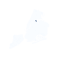

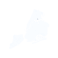

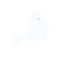

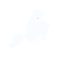

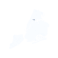

...

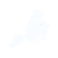

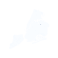

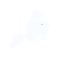

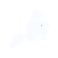

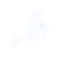

In [8]:
#dimension 116 x 77 (w x h)
w = 116
h = 77
mydpi = 96
for row in range(0,len(ny_tract)): 
    censusid = ny_tract.at[row,'tractid']
    newdf = ny_tract.copy()
    newdf['indicator'] = 0
    newdf.at[row,'indicator'] = 10
    print(newdf)

    ax = newdf.plot(column='indicator',cmap='Blues',figsize=(w/mydpi, h/mydpi))
    ax.axis('off')
    #plt.figure(, dpi=mydpi)
    ax.figure.savefig('DataFiles/censuspng/'+str(censusid) + '.png',dpi = mydpi)
    
    im = img.open('DataFiles/censuspng/'+str(censusid) + '.png')
    rgb_im = im.convert('RGB')
    rgb_im.save('DataFiles/censusjpg/'+str(censusid) + '.jpg','JPEG')

In [68]:
plt.plot?